# Visualizing the San Francisco crimes data set

In the following notebook, the San Francisco crimes data set has been visualized in verities of ways, which provides valuable insight which can be used to implementing the data engineing that requires for the classification section.



* This dataset contains incidents derived from San Francisco Police Department Crime Incident Reporting system. 
* The data ranges from 2003-01-01 to 2015-05-13. 
* The training set and test set rotate every week, meaning week 1,3,5,7... belong to test set, week 2,4,6,8 belong to training set. 

### Following is a short summery of the data sets layout

* Dates - timestamp of the crime incident
* Category - category of the crime incident (only in train.csv). This is the target variable you are going to predict.
* Descript - detailed description of the crime incident (only in train.csv)
* DayOfWeek - the day of the week
* PdDistrict - name of the Police Department District
* Resolution - how the crime incident was resolved (only in train.csv)
* Address - the approximate street address of the crime incident 
* X - Longitude
* Y - Latitude

Data visualizations index:  
- [Which are the most and least reoccurring crimes?](#category)

- [Which are the most and least safest districts?](#district)

- [Time series analysis](#timeseries)
    - [How may crime has occured in each year between 2003 and 2015](#year)
    - [How may crime has occured during hours of a day](#Hours)
    - [How may crime has occured during each day of a week](#dayofaweek)
    - [How may crime has occured during days of a year](#dayofyear)
    
- [Visualizing the San Francisco crimes categories on maps](#map)

 
In the following notebook I have plotted most of the data with “Plotly”, since GitHub cannot render these interactive plots I have added this notebook to my [Anaconda]( https://anaconda.org/sohrabrs/data_visualization_201607/notebook) account.


In [1]:
%load_ext watermark
%watermark -a 'Sohrab' -u -d -v -p numpy,pandas,matplotlib

import os

import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline

import numpy as np
import datetime as df
import time
#%matplotlib inline


import matplotlib.image as mpimg
import statsmodels.nonparametric.api as smnp
import seaborn as sns

import plotly as pl

from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly.graph_objs import Bar, Scatter, Figure, Layout

from plotly.graph_objs import *
import numpy as np

import cufflinks as cf

import folium
from folium.plugins import MarkerCluster
from folium import plugins
from folium.plugins import HeatMap
from IPython.display import HTML
import folium
from IPython.html import widgets
from IPython.display import display, Image, HTML, clear_output

print ("plotly ",__version__)
init_notebook_mode(connected=True)




Sohrab 
last updated: 2016-08-29 

CPython 3.5.2
IPython 4.2.0

numpy 1.11.1
pandas 0.18.1
matplotlib 1.5.1
plotly  1.12.5


/anaconda/anaconda3/anaconda/lib/python3.5/site-packages/IPython/html.py:14: ShimWarning:

The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.



In [2]:
## Importing the data sets
train = pd.read_csv('../Dataset/train-2.csv', parse_dates=['Dates'])
test = pd.read_csv('../Dataset/test-2.csv', parse_dates=['Dates'])

In [3]:
#Add day of the year format 01-11 (Month, Day)
train['DayOfYear'] = train['Dates'].map(lambda x: x.strftime("%m-%d"))
test['DayOfYear']  = test['Dates'].map( lambda x: x.strftime("%m-%d"))

In [4]:
train['hour'] = train.Dates.dt.hour
test['hour'] = test.Dates.dt.hour

train['year'] = train.Dates.dt.year
test['year'] = test.Dates.dt.year

train['Days'] = train.Dates.dt.date
test['Days'] = test.Dates.dt.date

train.tail()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y,DayOfYear,hour,year,Days
878044,2003-01-06 00:15:00,ROBBERY,ROBBERY ON THE STREET WITH A GUN,Monday,TARAVAL,NONE,FARALLONES ST / CAPITOL AV,-122.459033,37.714056,01-06,0,2003,2003-01-06
878045,2003-01-06 00:01:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Monday,INGLESIDE,NONE,600 Block of EDNA ST,-122.447364,37.731948,01-06,0,2003,2003-01-06
878046,2003-01-06 00:01:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Monday,SOUTHERN,NONE,5TH ST / FOLSOM ST,-122.403390,37.780266,01-06,0,2003,2003-01-06
878047,2003-01-06 00:01:00,VANDALISM,"MALICIOUS MISCHIEF, VANDALISM OF VEHICLES",Monday,SOUTHERN,NONE,TOWNSEND ST / 2ND ST,-122.390531,37.780607,01-06,0,2003,2003-01-06
878048,2003-01-06 00:01:00,FORGERY/COUNTERFEITING,"CHECKS, FORGERY (FELONY)",Monday,BAYVIEW,NONE,1800 Block of NEWCOMB AV,-122.394926,37.738212,01-06,0,2003,2003-01-06


In [5]:
train.describe()

,X,Y,hour,year
count,878049.000000,878049.000000,878049.000000,878049.000000
mean,-122.422616,37.771020,13.412655,2008.712046
std,0.030354,0.456893,6.549573,3.631194
min,-122.513642,37.707879,0.000000,2003.000000
25%,-122.432952,37.752427,9.000000,2006.000000
50%,-122.416420,37.775421,14.000000,2009.000000
75%,-122.406959,37.784369,19.000000,2012.000000
max,-120.500000,90.000000,23.000000,2015.000000


In [6]:
test.describe()

,Id,X,Y,hour,year
count,884262.000000,884262.000000,884262.000000,884262.000000,884262.000000
mean,442130.500000,-122.422693,37.771476,13.396023,2008.703743
std,255264.596206,0.030985,0.484824,6.558899,3.637850
min,0.000000,-122.513642,37.707879,0.000000,2003.000000
25%,221065.250000,-122.433069,37.752374,9.000000,2005.000000
50%,442130.500000,-122.416517,37.775421,14.000000,2009.000000
75%,663195.750000,-122.406959,37.784353,19.000000,2012.000000
max,884261.000000,-120.500000,90.000000,23.000000,2015.000000


In [7]:
train_days = train[["X", "DayOfYear"]].groupby(['DayOfYear']).count().rename(columns={"X": "Train_Count"})
test_days  = test[ ["X", "DayOfYear"]].groupby(['DayOfYear']).count().rename(columns={"X": "Test_Count"})

train_days_days = train[["X", "Days"]].groupby(['Days']).count().rename(columns={"X": "Train_Count_Days"})
test_days_days  = test[ ["X", "Days"]].groupby(['Days']).count().rename(columns={"X": "Test_Count_Days"})

train_daysh = train[["X", "hour"]].groupby(['hour']).count().rename(columns={"X": "Train_Count_Hour"})
test_daysh  = test[ ["X", "hour"]].groupby(['hour']).count().rename(columns={"X": "Test_Count_Hour"})

train_days_year = train[["X", "year"]].groupby(['year']).count().rename(columns={"X": "Train_Count_Year"})
test_days_year  = test[ ["X", "year"]].groupby(['year']).count().rename(columns={"X": "Test_Count_Year"})

In [8]:
year = train_days_year.merge(test_days_year, left_index=True, right_index=True, how= 'outer')
year = year.fillna(0)
year["Total_Count"] = year["Train_Count_Year"] + year["Test_Count_Year"]
year.tail()

,Train_Count_Year,Test_Count_Year,Total_Count
year,,,
2011,66619,66084,132703
2012,71731,69141,140872
2013,75606,77225,152831
2014,74766,75419,150185
2015,27584,28431,56015


<a id= 'category'></a>

## Most and least reoccurring crimes  

The following graph shows that there is a vast distribution between the reported crimes type, as we have Larceny/Theft with 174.9K and Trea with 6 for the most and least of reported crimes.

In [9]:
CategoryC = train.Category.value_counts()

iplot(CategoryC.iplot(asFigure=True,
                 kind='bar',
                 xTitle='',
                 yTitle='Total crime count',
                 title='Category of crimes'))




<a id= 'district'></a>
	
## Visualizing the category of crimes as the function of district



The following graph illustrates that Southern with proximity 157.18K and Richmond with 45.209K reposted crimes are the least to safest district in San Francisco. 



In [10]:
PdDistrictC = train.PdDistrict.value_counts()

iplot(PdDistrictC.iplot(asFigure=True,
                 kind='bar',
                 xTitle='',
                 yTitle='Total crime count',
                 title='Districts'))




<a id= 'timeseries'></a>
<a id= 'year'></a>

## Visualization the number of crime over the years.

The following graph depict that there is not a strong dependency of number of crimes and year. 



In [11]:
iplot(year.iplot(asFigure=True,
                 kind='bar',
                 xTitle='Year',
                 yTitle='Total crime count',
                 title='San Francisco crime count between 2003 and 2015'))

<a id= 'Hours'></a>
## Number of crime pattern over the hours of a day 

The following graph indicates that between hours of 1am and 7am is the safest time of a day and we have two peaks of 12pm and 6pm with most reported crimes.  This pattern is more or less consistence for the most 5 reported crimes. 

     


In [12]:
Hours = train_daysh.merge(test_daysh, left_index=True, right_index=True, how= 'outer')
Hours = Hours.fillna(0)
Hours["TotalCount"] = Hours["Train_Count_Hour"] + Hours["Test_Count_Hour"]
iplot(Hours.iplot(asFigure=True,
                 kind='bar',
                 xTitle='Hours of a day',
                 yTitle='Total crime count',
                 title='San Francisco FULL crime count throughout a day'))

In [13]:
listCatL = "LARCENY/THEFT","OTHER OFFENSES","NON-CRIMINAL","ASSAULT","DRUG/NARCOTIC","VEHICLE THEFT"
dfCategoryCount_H = pd.DataFrame()

for cat in listCatL:
    df = train[train.Category == cat]
    df = pd.DataFrame (df["hour"].value_counts())
    df.rename(columns  = {'hour': cat},inplace=True)
    
    if dfCategoryCount_H.empty:
        dfCategoryCount_H = df
    else:
        dfCategoryCount_H = dfCategoryCount_H.join(df)

        
        
iplot(dfCategoryCount_H.iplot(asFigure=True,
                 kind='bar',
                 xTitle='Hours of a day',
                 yTitle='Number of crime',
                 title='San Francisco crime count throughout a day; For the most 6 most comment crimes '))

In [14]:
listCatL = sorted(list(set(train.Category.tolist())))

dfCategoryCount_H = pd.DataFrame()

for cat in listCatL:
    df = train[train.Category == cat]
    df = pd.DataFrame (df["hour"].value_counts())
    df.rename(columns  = {'hour': cat},inplace=True)
    
    if dfCategoryCount_H.empty:
        dfCategoryCount_H = df
    else:
        dfCategoryCount_H = dfCategoryCount_H.join(df)

        
        
iplot(dfCategoryCount_H.iplot(asFigure=True,
                 kind='bar',
                 xTitle='Hours of a day',
                 yTitle='Number of crime',
                 title='San Francisco crime count throughout a day; AS the function of category of crimes'))

<a id= 'dayofaweek'></a>

## Number of crime as the function of days of a week.

The following graphs indicate that on average there is week dependency of days of a week to the number of reported crimes. At the same time slightly more crimes take place on Friday and the safest day of the week is Sunday. Although this pattern can be slightly different depending on the category of the crime. For instance, in “Other offenses” and “Drug/Narcotic” most arrests did take place on Wednesday.  While “Drunkenness” related offences are highest during the Saturday and Sunday.  



In [15]:
PdDistrictC = train.DayOfWeek.value_counts()

iplot(PdDistrictC.iplot(asFigure=True,
                 kind='bar',
                 xTitle='',
                 yTitle='Total crime count',
                 title='Day Of Week'))

In [16]:
listCatL = "LARCENY/THEFT","OTHER OFFENSES","NON-CRIMINAL","ASSAULT","DRUG/NARCOTIC","VEHICLE THEFT"
dfCategoryCount = pd.DataFrame()

for cat in listCatL:
    df = train[train.Category == cat]
    df = pd.DataFrame (df["DayOfWeek"].value_counts())
    df.rename(columns  = {'DayOfWeek': cat},inplace=True)
    
    if dfCategoryCount.empty:
        dfCategoryCount = df
    else:
        dfCategoryCount = dfCategoryCount.join(df)
        
iplot(dfCategoryCount.iplot(asFigure=True,
                 kind='bar',
                 xTitle='Days of a week',
                 yTitle='Total crime count',
                 title='San Francisco crime count throughout days of week for the 6 most frequent crimes '))

In [17]:
listCatL = sorted(list(set(train.Category.tolist())))
dfCategoryCount = pd.DataFrame()

for cat in listCatL:
    df = train[train.Category == cat]
    df = pd.DataFrame (df["DayOfWeek"].value_counts())
    df.rename(columns  = {'DayOfWeek': cat},inplace=True)
    
    if dfCategoryCount.empty:
        dfCategoryCount = df
    else:
        dfCategoryCount = dfCategoryCount.join(df)
iplot(dfCategoryCount.iplot(asFigure=True,
                 kind='bar',
                 xTitle='Days of a week',
                 yTitle='Total crime count',
                 title='San Francisco crime count throughout days of week'))

<a id= 'dayofyear'></a>

## Number of crime as the function of days of a year. 


As you can see in the following graphs, unfortunately Plotly cannot provide an accurate reflection of data, as the x axis is plotted from the Pandas da of year. I have been in contact with the developer but so far the issue has not been resolved. Thus, for time being, I'm plotting this section with “matplotlib”.  

In the following graphs we see that there are two dates with a peak in number of crimes, the first one is the leap day which is self-explanatory, the other day is Christmas day. We have also can see an increase in number of reported crime at the benign of each month. 




In [18]:
daysofayear = train_days.merge(test_days, left_index=True, right_index=True, how= 'outer')
daysofayear = daysofayear.fillna(0)
daysofayear["Total_Count"] = daysofayear["Train_Count"] + daysofayear["Test_Count"]

iplot(daysofayear.iplot(asFigure=True,
                 kind='scatter',
                 xTitle='Days of a year',
                 yTitle='Total crime count',
                 title='San Francisco crime count'))



In [19]:
days = train_days_days.merge(test_days_days, left_index=True, right_index=True, how= 'outer')
days = days.fillna(0)
days["Total_Count"] = days["Train_Count_Days"] + days["Test_Count_Days"]

iplot(days.iplot(asFigure=True,
                 kind='scatter',
                 xTitle='Days of a year',
                 yTitle='Total crime count',
                 title='San Francisco crime count'))




#### Unfortunately Plotly has a bug and dose not plot the data in a correct way. So far I have not yet managed to get any relevant reply from the developer. For time being, I'm plotting this section with “matplotlib”.

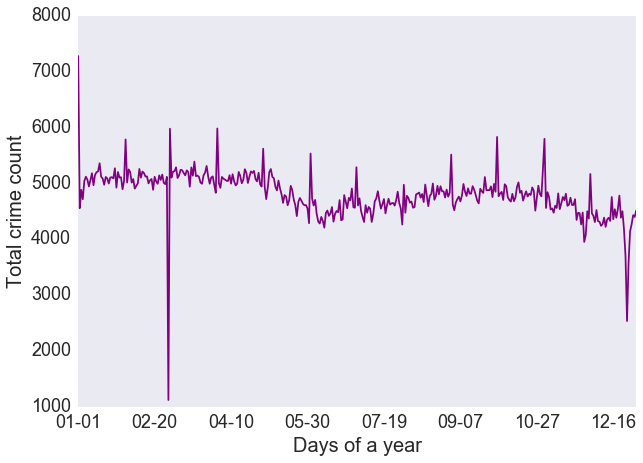

In [20]:
fig, ax = plt.subplots()
daysofayear['Total_Count'].plot(legend=False,figsize=(10,7),color = 'purple')
plt.setp(ax.get_xticklabels(),fontsize=18,family='sans-serif')
plt.setp(ax.get_yticklabels(),fontsize=18,family='sans-serif')
plt.xlabel('Days of a year',fontsize=20,family='sans-serif')
plt.ylabel('Total crime count',fontsize=20,family='sans-serif')
plt.grid(False)
plt.show()


## Plot the data for the past 4 years 


###   Number of the crimes that occurred in year 2013 as the function of the day.

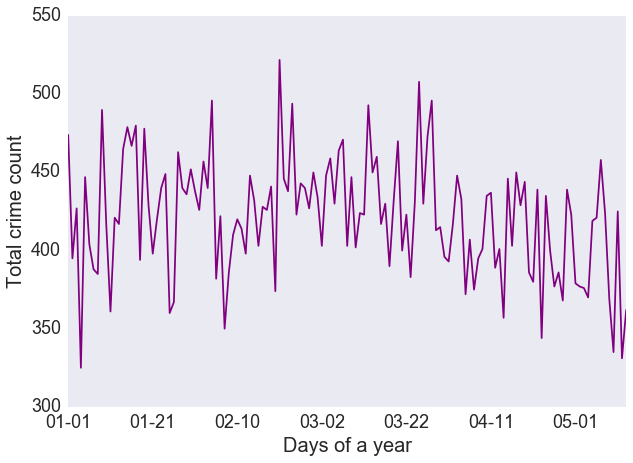

In [21]:
train14 = train[train.year == 2015]
test14 = test[test.year == 2015]
train_days_2014 = train14[["X", "DayOfYear"]].groupby(['DayOfYear']).count().rename(columns={"X": "TrainCount"})
test_days_2014  = test14[ ["X", "DayOfYear"]].groupby(['DayOfYear']).count().rename(columns={"X": "TestCount"})
days14 = train_days_2014.merge(test_days_2014, left_index=True, right_index=True, how='outer')
day14 = days14.fillna(0)
day14["TotalCount"] = day14["TrainCount"] + day14["TestCount"]

fig, ax = plt.subplots()
day14['TotalCount'].plot(legend=False,figsize=(10,7),color = 'purple')
plt.setp(ax.get_xticklabels(),fontsize=18,family='sans-serif')
plt.setp(ax.get_yticklabels(),fontsize=18,family='sans-serif')
plt.xlabel('Days of a year',fontsize=20,family='sans-serif')
plt.ylabel('Total crime count',fontsize=20,family='sans-serif')
plt.grid(False)
plt.show()
fig.savefig('totalcrimecount2')

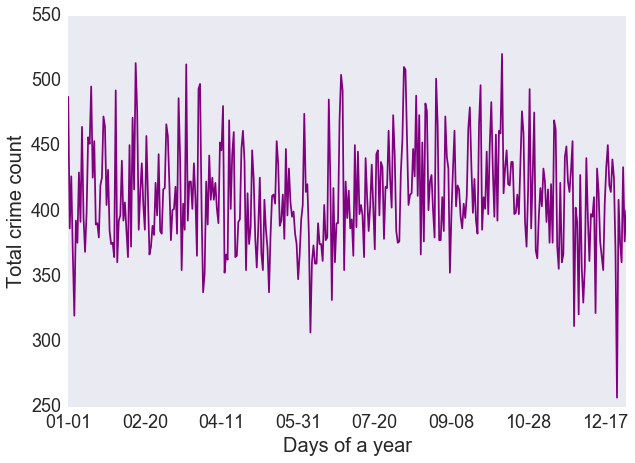

In [22]:
train14 = train[train.year == 2014]
test14 = test[test.year == 2014]
train_days_2014 = train14[["X", "DayOfYear"]].groupby(['DayOfYear']).count().rename(columns={"X": "TrainCount"})
test_days_2014  = test14[ ["X", "DayOfYear"]].groupby(['DayOfYear']).count().rename(columns={"X": "TestCount"})
days14 = train_days_2014.merge(test_days_2014, left_index=True, right_index=True, how='outer')
day14 = days14.fillna(0)
day14["TotalCount"] = day14["TrainCount"] + day14["TestCount"]

fig, ax = plt.subplots()
day14['TotalCount'].plot(legend=False,figsize=(10,7),color = 'purple')
plt.setp(ax.get_xticklabels(),fontsize=18,family='sans-serif')
plt.setp(ax.get_yticklabels(),fontsize=18,family='sans-serif')
plt.xlabel('Days of a year',fontsize=20,family='sans-serif')
plt.ylabel('Total crime count',fontsize=20,family='sans-serif')
plt.grid(False)
plt.show()
fig.savefig('totalcrimecount2')

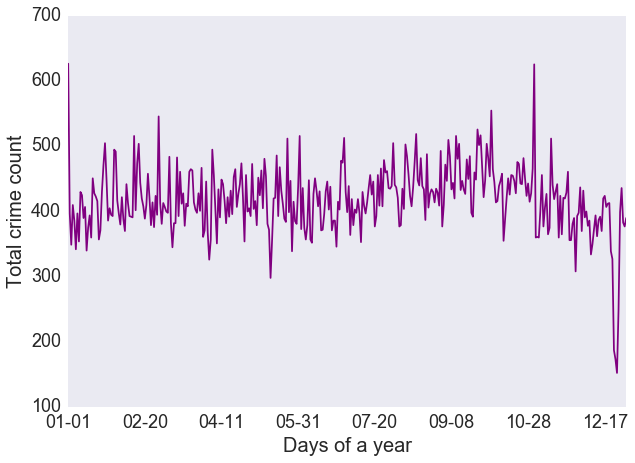

In [23]:
train14 = train[train.year == 2013]
test14 = test[test.year == 2013]
train_days_2014 = train14[["X", "DayOfYear"]].groupby(['DayOfYear']).count().rename(columns={"X": "TrainCount"})
test_days_2014  = test14[ ["X", "DayOfYear"]].groupby(['DayOfYear']).count().rename(columns={"X": "TestCount"})
days14 = train_days_2014.merge(test_days_2014, left_index=True, right_index=True, how='outer')
day14 = days14.fillna(0)
day14["TotalCount"] = day14["TrainCount"] + day14["TestCount"]

fig, ax = plt.subplots()
day14['TotalCount'].plot(legend=False,figsize=(10,7),color = 'purple')
plt.setp(ax.get_xticklabels(),fontsize=18,family='sans-serif')
plt.setp(ax.get_yticklabels(),fontsize=18,family='sans-serif')
plt.xlabel('Days of a year',fontsize=20,family='sans-serif')
plt.ylabel('Total crime count',fontsize=20,family='sans-serif')
plt.grid(False)
plt.show()
fig.savefig('totalcrimecount2')

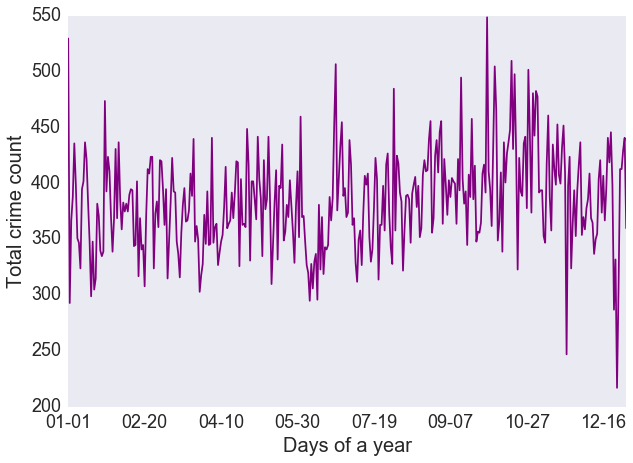

In [24]:
train14 = train[train.year == 2012]
test14 = test[test.year == 2012]
train_days_2014 = train14[["X", "DayOfYear"]].groupby(['DayOfYear']).count().rename(columns={"X": "TrainCount"})
test_days_2014  = test14[ ["X", "DayOfYear"]].groupby(['DayOfYear']).count().rename(columns={"X": "TestCount"})
days14 = train_days_2014.merge(test_days_2014, left_index=True, right_index=True, how='outer')
day14 = days14.fillna(0)
day14["TotalCount"] = day14["TrainCount"] + day14["TestCount"]

fig, ax = plt.subplots()
day14['TotalCount'].plot(legend=False,figsize=(10,7),color = 'purple')
plt.setp(ax.get_xticklabels(),fontsize=18,family='sans-serif')
plt.setp(ax.get_yticklabels(),fontsize=18,family='sans-serif')
plt.xlabel('Days of a year',fontsize=20,family='sans-serif')
plt.ylabel('Total crime count',fontsize=20,family='sans-serif')
plt.grid(False)
plt.show()
fig.savefig('totalcrimecount2')

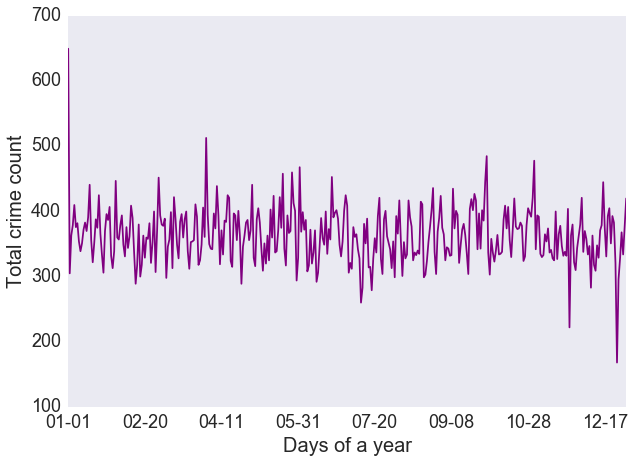

In [25]:
train14 = train[train.year == 2011]
test14 = test[test.year == 2011]
train_days_2014 = train14[["X", "DayOfYear"]].groupby(['DayOfYear']).count().rename(columns={"X": "TrainCount"})
test_days_2014  = test14[ ["X", "DayOfYear"]].groupby(['DayOfYear']).count().rename(columns={"X": "TestCount"})
days14 = train_days_2014.merge(test_days_2014, left_index=True, right_index=True, how='outer')
day14 = days14.fillna(0)
day14["TotalCount"] = day14["TrainCount"] + day14["TestCount"]

fig, ax = plt.subplots()
day14['TotalCount'].plot(legend=False,figsize=(10,7),color = 'purple')
plt.setp(ax.get_xticklabels(),fontsize=18,family='sans-serif')
plt.setp(ax.get_yticklabels(),fontsize=18,family='sans-serif')
plt.xlabel('Days of a year',fontsize=20,family='sans-serif')
plt.ylabel('Total crime count',fontsize=20,family='sans-serif')
plt.grid(False)
plt.show()
fig.savefig('totalcrimecount2')

<a id= 'map'></a>   

## Visualizing the San Francisco crimes categories on maps

Visualizing the crimes on the San Francisco map can provide thorough insight for predictive model creation, however, the abundance of actual crimes in each year and category cause the maps to become extremely large and therefore difficult to load in this Ipython notebook. The following is a collection of three different map types that illustrate San Francisco crime data: 
-	Heatmaps – Only for ““LARCENY/THEFT” and each of these three heatmaps have been embedded into the notebook and have been separated into individual maps. 
- MarkerCluster- For the first 4 most reoccurring crimes, “LARCENY/THEFT”, "OTHER OFFENSES", "NON-CRIMINAL", and “ASSAULT”, which are exported to a HTML file due to their large size. 
-	Circular marker- Only for “LARCENY/THEFT” which is exported to a HTML file due to its large size. 







## Heatmaps for "LARCENY/THEFT"


Folium heatmaps are constructed in nice and light which allows us to visualize large number of incidences, but as the following figures illustrate due to large number of incidences, this type of visualization is not informative. The first of these illustrates the sum of all “LARCENY/THEFT” between 2003 to 2015, the next one focuses on “LARCENY/THEFT” in 2010 and the last of these focuses on “LARCENY/THEFT” in 2015. And by zooming out of these image, only a red map can be seen. In conclusion, this visualization is not helpful. 
 



In [26]:
subset = train[train.Category == "LARCENY/THEFT"][['Y', 'X']]
coordinates = [tuple(x) for x in subset.values]

# initialize map
mapa = folium.Map(location=[37.7880, -122.4074] , zoom_start=18)

# add marker clusters
mapa.add_children(HeatMap(coordinates))
mapa

In [27]:
subset = train[train.Category == "LARCENY/THEFT"]
subset = train[train.year == 2010][['Y', 'X']]

coordinates = [tuple(x) for x in subset.values]
mapa = folium.Map(location=[37.7880, -122.4074] , zoom_start=18)
mapa.add_children(HeatMap(coordinates))
mapa

In [28]:
subset = train[train.Category == "LARCENY/THEFT"]
subset = train[train.year == 2015][['Y', 'X']]

coordinates = [tuple(x) for x in subset.values]
mapa = folium.Map(location=[37.7880, -122.4074] , zoom_start=18)
mapa.add_children(HeatMap(coordinates))
mapa

## Circle_marker map of "LARCENY/THEFT"

Similar to Heatmap, due to the large number of incidents this map cannot provide any useful insight information. 
Also as each of the following maps are more than 60MB in sieze Jupyter notebook cannot show them but you can see them in [Circle_marker map of "LARCENY/THEFT"](https://dl.dropboxusercontent.com/u/5666137/sf/LARCENYTHEFT_circle_marker.html)


In [28]:
def latlong(geo):
    latitude,longitude = geo
    return latitude, longitude

train['X_Y']= train[['Y','X']].apply(latlong, axis=1)

LARCENY = train[train.Category == "LARCENY/THEFT"]['X_Y']

map = folium.Map(location=[37.77, -122.41], zoom_start=12)
for latlong in LARCENY:
    map.circle_marker(latlong, radius=2,
                      line_color='blue',fill_color='blue', fill_opacity=0.2)
map.save("../Maps/LARCENYTHEFT_circle_marker.html")

/anaconda/anaconda3/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:12: FutureWarning:

circle_marker is deprecated. Use add_children(CircleMarker) instead



<img src="../Maps/LarcenytheftB.png">

## MarkerCluster maps of "LARCENY/THEFT", "OTHER OFFENSES", "NON-CRIMINAL", and "ASSAULT" 

In the following MarkerCluster maps are plotted for “LARCENY/THEFT” , “OTHER OFFENSES”, “NON-CRIMINAL” and “ASSAULT. This method is very informative and as one can see it is possible to see the pattern in number of incidences depending on the neighborhood and also by zooming in each section of town has it most and least safe corners. For instance, in “LARCENY/THEFT” map, South of Market district with 61623 and Ingleside with 1187 reported incidents respectively, have the highest and lowers reported crimes over the years. 

MarkerCluster maps of [LARCENY/THEFT](https://dl.dropboxusercontent.com/u/5666137/sf/LARCENYTHEFT.html), [OTHER OFFENSES](https://dl.dropboxusercontent.com/u/5666137/sf/OTHEROFFENSES.html), [NON-CRIMINAL](https://dl.dropboxusercontent.com/u/5666137/sf/CRIMINAL.html), and [ASSAULT](https://dl.dropboxusercontent.com/u/5666137/sf/ASSAULT.html).

In [29]:
subset = train[train.Category == "LARCENY/THEFT"][['Y', 'X']]
coordinates = [tuple(x) for x in subset.values]

# initialize map
mapa = folium.Map(location=[37.77, -122.41] , zoom_start=12)

# add marker clusters
mapa.add_children(MarkerCluster(locations = coordinates, popups=coordinates))
mapa.save("../Maps/LARCENYTHEFT.html")

<img src="../Maps/Larcenytheft.png">

In [30]:
subset = train[train.Category == "OTHER OFFENSES"][['Y', 'X']]
coordinates = [tuple(x) for x in subset.values]

# initialize map
map = folium.Map(location=[37.77, -122.41] , zoom_start=12)

# add marker clusters
mapa.add_children(MarkerCluster(locations = coordinates, popups=coordinates))
mapa.save("../Maps/OTHEROFFENSES.html")

<img src="../Maps/Otheroffenses.png">

In [31]:
subset = train[train.Category == "NON-CRIMINAL"][['Y', 'X']]
coordinates = [tuple(x) for x in subset.values]

# initialize map
mapa = folium.Map(location=[37.77, -122.41] , zoom_start=12)

# add marker clusters
mapa.add_children(MarkerCluster(locations = coordinates, popups=coordinates))
mapa.save("../Maps/CRIMINAL.html")

<img src="../Maps/Criminal.png">

In [32]:
subset = train[train.Category == "ASSAULT"][['Y', 'X']]
coordinates = [tuple(x) for x in subset.values]

# initialize map
mapa = folium.Map(location=[37.77, -122.41] , zoom_start=12)

# add marker clusters
mapa.add_children(MarkerCluster(locations = coordinates, popups=coordinates))
mapa.save("../Maps/ASSAULT.html")

<img src="../Maps/Assault.png">